In [4]:
## Import Packages
from __future__ import print_function

import numpy as np
import pandas as pd
from itertools import product

#Astro Software
import astropy.units as units
from astropy.coordinates import SkyCoord
from astropy.io import fits

#Plotting Packages
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams

import seaborn as sns

from PIL import Image

from yt.config import ytcfg
import yt
import yt.units as u

#Scattering NN
import torch
import torch.nn.functional as F
from torch import optim
from kymatio.torch import Scattering2D
device = "cpu"

#Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.decomposition import PCA, FastICA

import skimage
from skimage import filters

from scipy.optimize import curve_fit
from scipy import linalg
from scipy import stats
from scipy.signal import general_gaussian

#I/O
import h5py
import pickle
import glob
import copy
import time

#Plotting Style
%matplotlib inline
plt.style.use('dark_background')
rcParams['text.usetex'] = False
rcParams['axes.titlesize'] = 20
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 12
rcParams['axes.labelsize'] = 20
rcParams['font.family'] = 'sans-serif'

#Threading
torch.set_num_threads=2
from multiprocessing import Pool

import ntpath
def path_leaf(path):
    head, tail = ntpath.split(path)
    out = os.path.splitext(tail)[0]
    return out

def hd5_open(file_name,name):
    f=h5py.File(file_name,'r', swmr=True)
    data = f[name][:]
    f.close()
    return data

from matplotlib.colors import LinearSegmentedColormap
cdict1 = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 0.0, 0.0),
                   (1.0, 0.0, 0.0)),

         'blue':  ((0.0, 0.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
blue_red1 = LinearSegmentedColormap('BlueRed1', cdict1,N=5000)

from sklearn.preprocessing import StandardScaler

In [5]:
def DHC_iso_vec(wst,J,L):
    (nk, Nd) = np.shape(wst)
    S0 = wst[:,0:2]
    S1 = wst[:,2:J*L+2]
    S2 = np.reshape(wst[:,J*L+3:],(nk,(J*L+1),(J*L+1)))
    
    S1iso = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            S1iso[:,j1] += S1[:,l1*J+j1]
    
    S2iso = np.zeros((nk,J,J,L))
    for j1 in range(J):
        for j2 in range(J):
            for l1 in range(L):
                for l2 in range(L):
                    deltaL = np.mod(l1-l2,L)
                    S2iso[:,j1,j2,deltaL] += S2[:,l1*J+j1,l2*J+j2]
                    
    Sphi1 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi1[:,j1] += S2[:,l1*J+j1,L*J]
            
    Sphi2 = np.zeros((nk,J))
    for j1 in range(J):
        for l1 in range(L):
            Sphi2[:,j1] += S2[:,L*J,l1*J+j1]
            
    return np.hstack((S0,S1iso,wst[:,J*L+2].reshape(nk,1),S2iso.reshape(nk,J*J*L),Sphi1,Sphi2,S2[:,L*J,L*J].reshape(nk,1)))

In [9]:
mnist_DHC_out_sizetrain = hd5_open('../../DHC/scratch_AKS/data/mnist_DHC_out_rot7pi_8.h5','main/data')
mnist_DHC_out_sizetest = hd5_open('../../DHC/scratch_AKS/data/mnist_DHC_out_rot7pi_8_test.h5','main/data')
mnist_DHC_out_sizetest_iso = DHC_iso_vec(mnist_DHC_out_sizetest,6,8)
mnist_DHC_out_sizetrain_iso = DHC_iso_vec(mnist_DHC_out_sizetrain,6,8)

In [10]:
mnist_train_y = hd5_open('../../DHC/scratch_AKS/data/mnist_train_y.h5','main/data')
mnist_test_y = hd5_open('../../DHC/scratch_AKS/data/mnist_test_y.h5','main/data')

In [11]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.linear_model import LinearRegression

In [12]:
lb = LabelBinarizer()
test_y_onehot = lb.fit_transform(mnist_test_y)

In [13]:
lb = LabelBinarizer()
train_y_onehot = lb.fit_transform(mnist_train_y)

In [14]:
lb.classes_

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [15]:
test_y_onehot.shape

(10000, 10)

In [16]:
X_inv1 = np.linalg.pinv(mnist_DHC_out_sizetrain_iso)

In [17]:
temp = np.matmul(X_inv1,mnist_train_y)
temp.shape

(310,)

In [18]:
temp = np.matmul(X_inv1,test_y_onehot)
temp.shape

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 10000 is different from 60000)

In [19]:
from sklearn.linear_model import LinearRegression

In [20]:
reg = LinearRegression().fit(mnist_DHC_out_sizetrain_iso, mnist_train_y)
reg.score(mnist_DHC_out_sizetest_iso, mnist_test_y)

0.7913310369925209

In [21]:
y_pred = reg.predict(mnist_DHC_out_sizetest_iso)

In [22]:
np.mean(np.square(y_pred-mnist_test_y))

1.7497302457488046

In [23]:
np.mean(np.square(np.round(y_pred)-mnist_test_y))

1.8281

In [24]:
reg = LinearRegression().fit(mnist_DHC_out_sizetrain_iso, train_y_onehot)
reg.score(mnist_DHC_out_sizetest_iso, test_y_onehot)

0.7336133279945846

In [25]:
y_pred = reg.predict(mnist_DHC_out_sizetest_iso)
y_pred.shape

(10000, 10)

In [26]:
np.mean(np.square(y_pred-test_y_onehot))

0.023754004118216206

In [27]:
np.count_nonzero(np.argmax(y_pred,axis=1)-mnist_test_y)/10000

0.07

This is a silly aside about adversarial noise

In [64]:
y_pred = reg.predict(mnist_DHC_out_sizetrain_iso)

In [66]:
y_pred[2],mnist_train_y[2]

(array([ 0.15226977,  0.02797252,  0.01975287, -0.04906825,  0.61016527,
         0.40539511, -0.18594769,  0.22294266,  0.02871172, -0.23219519]),
 4)

In [84]:
v = reg.coef_[4,:]/np.sqrt(np.dot(reg.coef_[4,:],reg.coef_[4,:]))
np.dot(v,v)

1.0

In [95]:
norm = np.sqrt(np.dot(mnist_DHC_out_sizetrain_iso[2,:],mnist_DHC_out_sizetrain_iso[2,:]))
norm

0.4940441502240431

In [85]:
np.dot(v,mnist_DHC_out_sizetrain_iso[2,:])

1.980653534304315e-09

In [96]:
temp = np.zeros(10)
for i in range(0,10):
    v = reg.coef_[i,:]/np.sqrt(np.dot(reg.coef_[i,:],reg.coef_[i,:]))
    temp[i] = np.dot(v,mnist_DHC_out_sizetrain_iso[2,:])/norm

In [97]:
np.argmax(temp), temp

(4,
 array([ 2.12257949e-09,  3.33265236e-10,  2.86790276e-10,  2.84564324e-09,
         4.00906181e-09,  7.85490764e-11, -5.39144382e-10, -2.29271551e-10,
        -2.22328935e-09, -2.78461379e-09]))

In [69]:
np.dot(reg.coef_[5,:],mnist_DHC_out_sizetrain_iso[2,:])

33.64474291470833

In [70]:
np.dot(reg.coef_[6,:],mnist_DHC_out_sizetrain_iso[2,:])

-381.3469350002706

In [71]:
np.dot(reg.coef_[7,:],mnist_DHC_out_sizetrain_iso[2,:])

-246.50660598650575

In [72]:
np.dot(reg.coef_[8,:],mnist_DHC_out_sizetrain_iso[2,:])

-550.6662323884666

In [73]:
np.dot(reg.coef_[9,:],mnist_DHC_out_sizetrain_iso[2,:])

-909.7655011080205

In [75]:
np.dot(reg.coef_[0,:],mnist_DHC_out_sizetrain_iso[2,:])

354.47854577563703

In [76]:
np.dot(reg.coef_[1,:],mnist_DHC_out_sizetrain_iso[2,:])

241.90214091539383

In [77]:
np.dot(reg.coef_[2,:],mnist_DHC_out_sizetrain_iso[2,:])

98.73541048914194

In [78]:
np.dot(reg.coef_[3,:],mnist_DHC_out_sizetrain_iso[2,:])

970.9287595693022

In [79]:
np.dot(reg.coef_[4,:],mnist_DHC_out_sizetrain_iso[2,:])

388.5957351103425

This is what I was doing in the past... sorry for the out of order

In [29]:
class_pred = np.argmax(y_pred,axis=1)

In [30]:
def cm_eval(y_pred, y_true,n_classes):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[y_true[indx],y_pred[indx]] += 1
    return cm.astype(int)

In [31]:
cm_1 = cm_eval(class_pred,mnist_test_y,10)

In [32]:
def cm_plot(cm,label_list):
    prec = np.diag(cm).sum()/np.sum(cm)
    print('Accuracy' + str(prec))
    cmap_normal = (cm.T/cm.sum(axis=1)).T
    
    ## Good plots
    vmin=0
    vmax=cm.shape[0]
    marker_size = 10

    from matplotlib import cm as cmplt
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    rgba_colors = [cmplt.Spectral(norm(indx)) for indx, i in enumerate(label_list)]
    color_order = ["black", "white"]
    color_map = "gray"
    colormap='Spectral'
    
    fig = plt.figure(figsize=(8,8),dpi=150)

    ax = fig.add_subplot(1,1,1)    
    ax.imshow(cmap_normal,
          interpolation='none',
          cmap=color_map,
          aspect='equal',
          vmin=0,vmax=1)

    ax.set_xticks(np.arange(cm.shape[0]))
    ax.set_yticks(np.arange(cm.shape[1]))
    
    for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
        ytick.set_color(color)

    ax.set_xticklabels(label_list)
    ax.set_yticklabels(label_list)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
             rotation_mode="anchor")
    plt.title('Test-Train Fidelity ({:.2f}%)'.format(100*prec))

    # Loop over data dimensions and create text annotations.
    textcolors=color_order
    threshold = 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] != 0:
                text = ax.text(j, i, cm[i, j],
                               ha="center", va="center", 
                               color=textcolors[int(cmap_normal[i, j] < threshold)])
    ax.margins(x=0.1, y=0.05)
    plt.show()
    
    return np.diag(cmap_normal)

Accuracy0.93


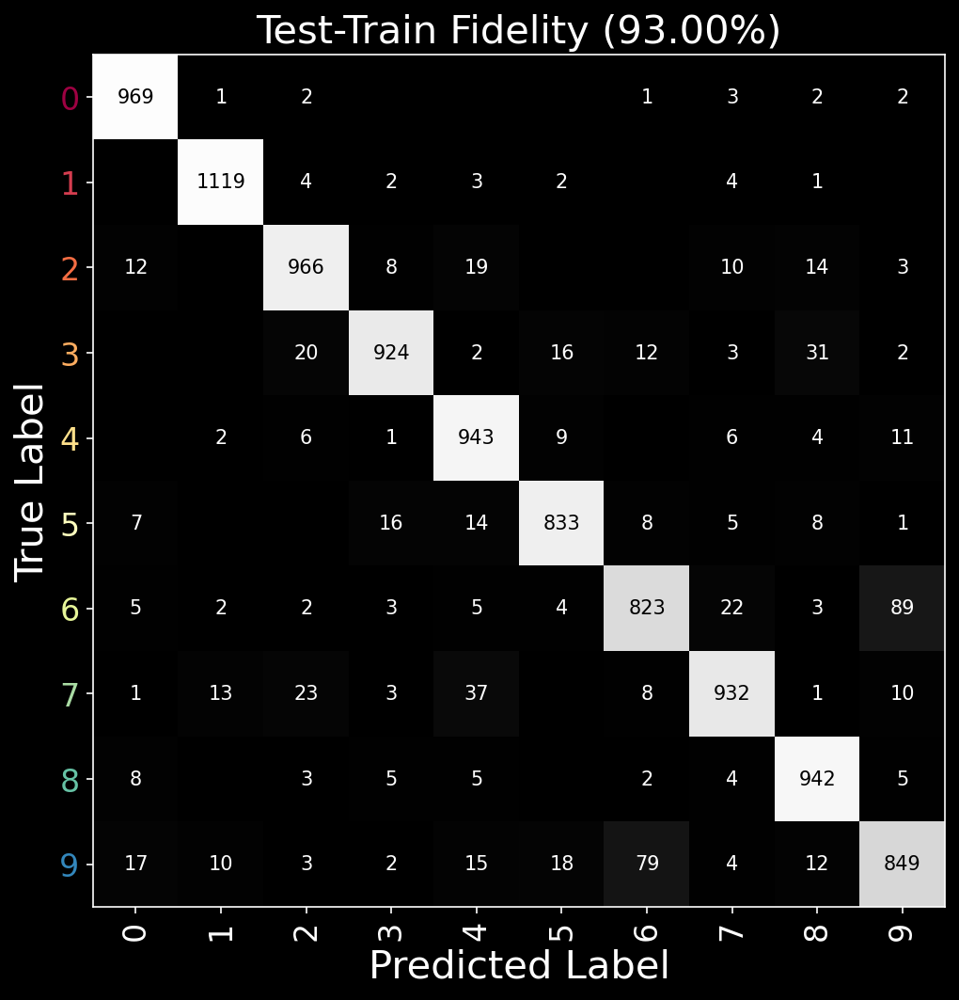

array([0.98877551, 0.98590308, 0.93604651, 0.91485149, 0.96028513,
       0.9338565 , 0.85908142, 0.90661479, 0.96714579, 0.84142716])

In [33]:
cm_plot(cm_1,[0,1,2,3,4,5,6,7,8,9])

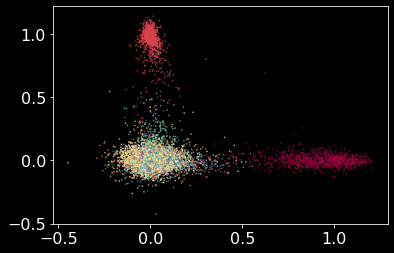

In [70]:
plt.scatter(y_pred[:,0],y_pred[:,1],c=mnist_test_y,cmap='Spectral',s=0.2)

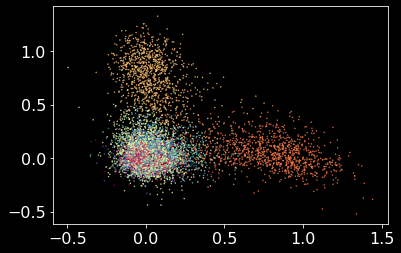

In [71]:
plt.scatter(y_pred[:,2],y_pred[:,3],c=mnist_test_y,cmap='Spectral',s=0.2)

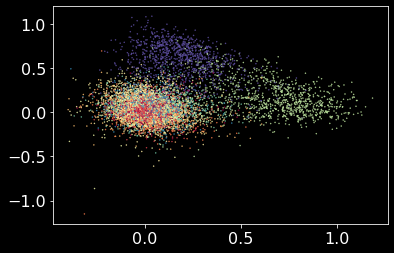

In [72]:
plt.scatter(y_pred[:,6],y_pred[:,9],c=mnist_test_y,cmap='Spectral',s=0.2)

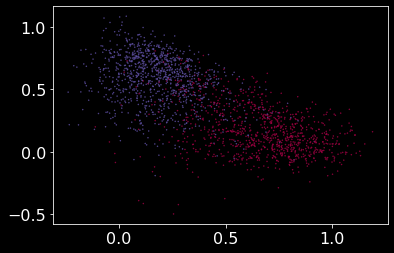

In [74]:
plt.scatter(y_pred[np.logical_or(mnist_test_y==6,mnist_test_y==9),6],y_pred[np.logical_or(mnist_test_y==6,mnist_test_y==9),9],c=mnist_test_y[np.logical_or(mnist_test_y==6,mnist_test_y==9)],cmap='Spectral',s=0.2)

In [ ]:
plt.scatter(y_pred[np.logical_or(mnist_test_y==6,mnist_test_y==9),6],y_pred[np.logical_or(mnist_test_y==6,mnist_test_y==9),9],c=mnist_test_y[np.logical_or(mnist_test_y==6,mnist_test_y==9)],cmap='Spectral',s=0.2)

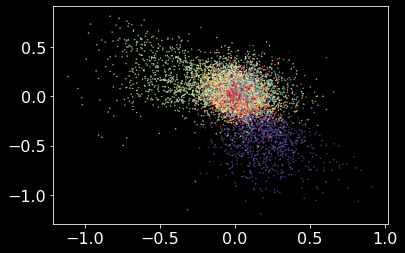

In [76]:
plt.scatter(y_pred[:,6]-test_y_onehot[:,6],y_pred[:,9]-test_y_onehot[:,9],c=mnist_test_y,cmap='Spectral',s=0.2)

In [99]:
def mnist_onehot(X_train,X_test,train_y,test_y,classes):
    n_classes = np.shape(classes)[0]
    lb = LabelBinarizer()
    train_y_onehot = lb.fit_transform(train_y)
    test_y_onehot = lb.fit_transform(test_y)
    
    reg = LinearRegression().fit(X_train, train_y_onehot)
    
    y_pred = reg.predict(X_test)
    
    lossl2 = np.mean(np.square(y_pred-test_y_onehot))
    class_pred = np.argmax(y_pred,axis=1)
    
    def cm_eval(y_pred, y_true,n_classes):
        cm = np.zeros((n_classes,n_classes))
        for indx in range(y_pred.shape[0]):
            cm[y_true[indx],y_pred[indx]] += 1
        return cm.astype(int)
    
    def cm_subplot(cm,label_list,ax,loss):
        prec = np.diag(cm).sum()/np.sum(cm)
        cmap_normal = (cm.T/cm.sum(axis=1)).T

        ## Good plots
        vmin=0
        vmax=cm.shape[0]-1
        marker_size = 10

        from matplotlib import cm as cmplt
        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        rgba_colors = [cmplt.Spectral(norm(indx)) for indx, i in enumerate(label_list)]
        color_order = ["black", "white"]
        color_map = "gray"
        colormap='Spectral'

        ax.imshow(cmap_normal,
              interpolation='none',
              cmap=color_map,
              aspect='equal',
              vmin=0,vmax=1)

        ax.set_xticks(np.arange(cm.shape[0]))
        ax.set_yticks(np.arange(cm.shape[1]))

        for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
            ytick.set_color(color)

        ax.set_xticklabels(label_list)
        ax.set_yticklabels(label_list)

        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')

        plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
                 rotation_mode="anchor")
        plt.title('TPP {:.2f}%/L2-Loss {:.3f}'.format(100*prec,loss))

        # Loop over data dimensions and create text annotations.
        textcolors=color_order
        threshold = 0.5
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                if cm[i, j] != 0:
                    text = ax.text(j, i, cm[i, j],
                                   ha="center", va="center", 
                                   color=textcolors[int(cmap_normal[i, j] < threshold)])
        ax.margins(x=0.1, y=0.05)

        return
    
    cm_0 = cm_eval(class_pred,test_y,n_classes)
    
    fig = plt.figure(figsize=(24,16),dpi=150)
    ax = fig.add_subplot(2,3,1)
    cm_subplot(cm_0,classes,ax,lossl2)
    
    for i in range(5):
        ax = fig.add_subplot(2,3,1+(i+1))
        plt.scatter(y_pred[:,2*i],y_pred[:,2*i+1],c=mnist_test_y,cmap='Spectral',s=0.2,vmin=0,vmax=9)
        plt.xlabel('{}-ness'.format(2*i))
        plt.ylabel('{}-ness'.format(2*i+1))
    return

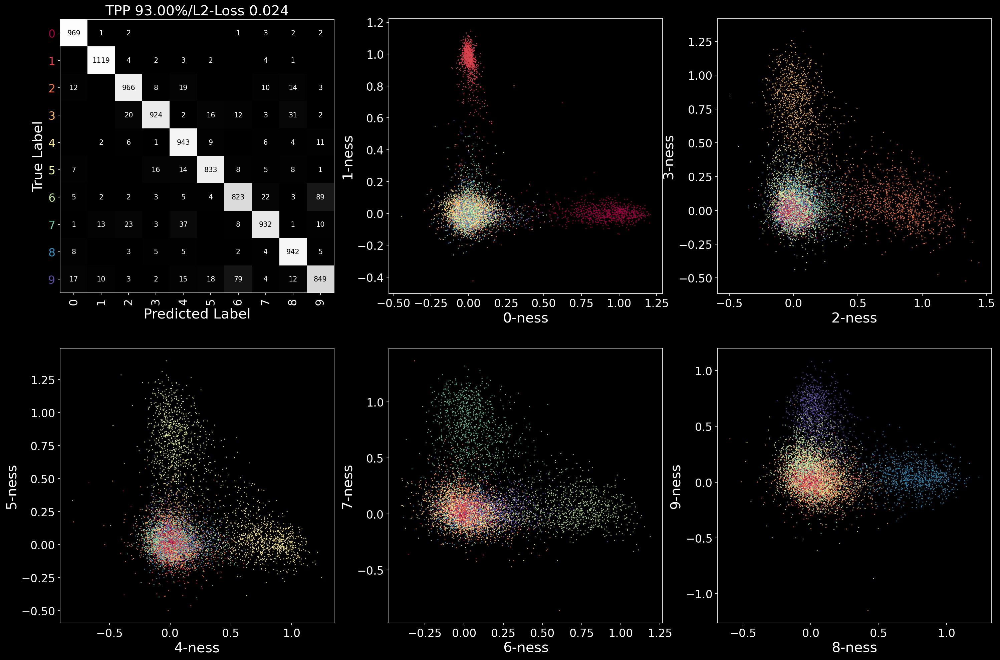

In [100]:
mnist_onehot(mnist_DHC_out_sizetrain_iso,mnist_DHC_out_sizetest_iso,mnist_train_y,mnist_test_y,[0,1,2,3,4,5,6,7,8,9])

We can explore a deeper comparison later. For now, we need to ask about continuous parameter estimation with CF.

In [4]:
import regex as re
from matplotlib import cm as cmplt

DHC_out_CF_log_a = hd5_open('../../CF/from_cannon/2021_01_31/CF_DHC_log_a.h5','main/data')

tlabels = hd5_open('../../CF/from_cannon/2021_01_30/label_a.h5','data')
full_list = hd5_open('../../CF/from_cannon/2021_01_31/full_file_list.h5','main/data')
string = [i.decode("utf-8")  for i in full_list]
regex = re.compile(r'\d+')
label_list = np.array([y for x in string for y in regex.findall(x)]).reshape(-1,8)
label_list = label_list[:,1:]
label_list = label_list.astype(np.float)

tlabels_cor_add = hd5_open('../../CF/from_cannon/2021_01_30/label_a_correction.h5','data')
tlabels[:,:7]=tlabels_cor_add

sort_tlabel= np.lexsort(tuple(tlabels[:,:7].T))
sort_label_list = np.lexsort(tuple(label_list.T))

sorted_tlabels = tlabels[sort_tlabel,:]
sorted_label = label_list[sort_label_list,:]

In [5]:
CF_DHC_iso_log_a = DHC_iso_vec(DHC_out_CF_log_a,6,8)

In [6]:
data = CF_DHC_iso_log_a
data_pre = np.arcsinh(data[sort_label_list,:]/(1e-20))
data_in = data_pre

In [7]:
train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,21]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

In [8]:
train_lossl2,test_lossl2

(566.9696640383249, 826.1248099482796)

Text(0, 0.5, 'Predicted Sound Speed')

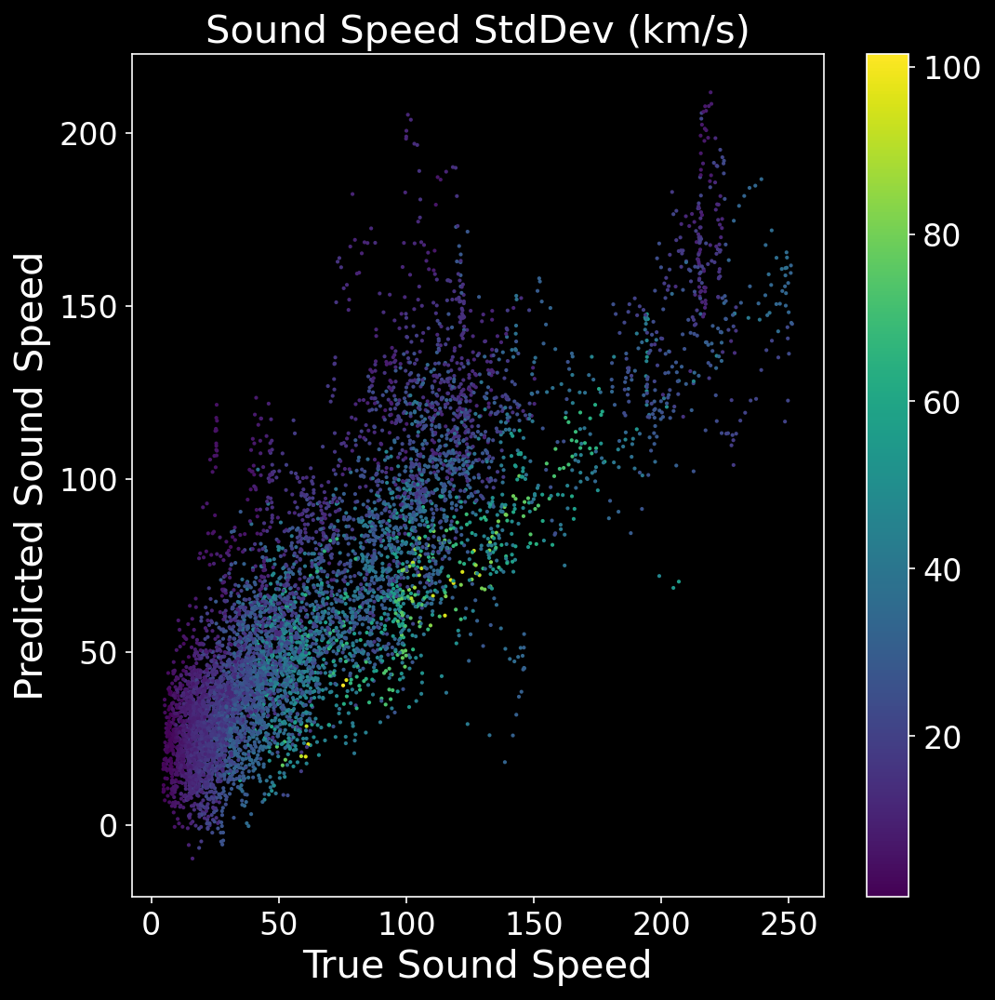

In [120]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test,y_pred_test,c=np.sqrt(sorted_tlabels[test,22]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Sound Speed')
plt.ylabel('Predicted Sound Speed')

In [121]:
train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,65]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(0.41956905780570447, 0.595654498473744)

(-0.5646819778260976, 13.08126936983971)

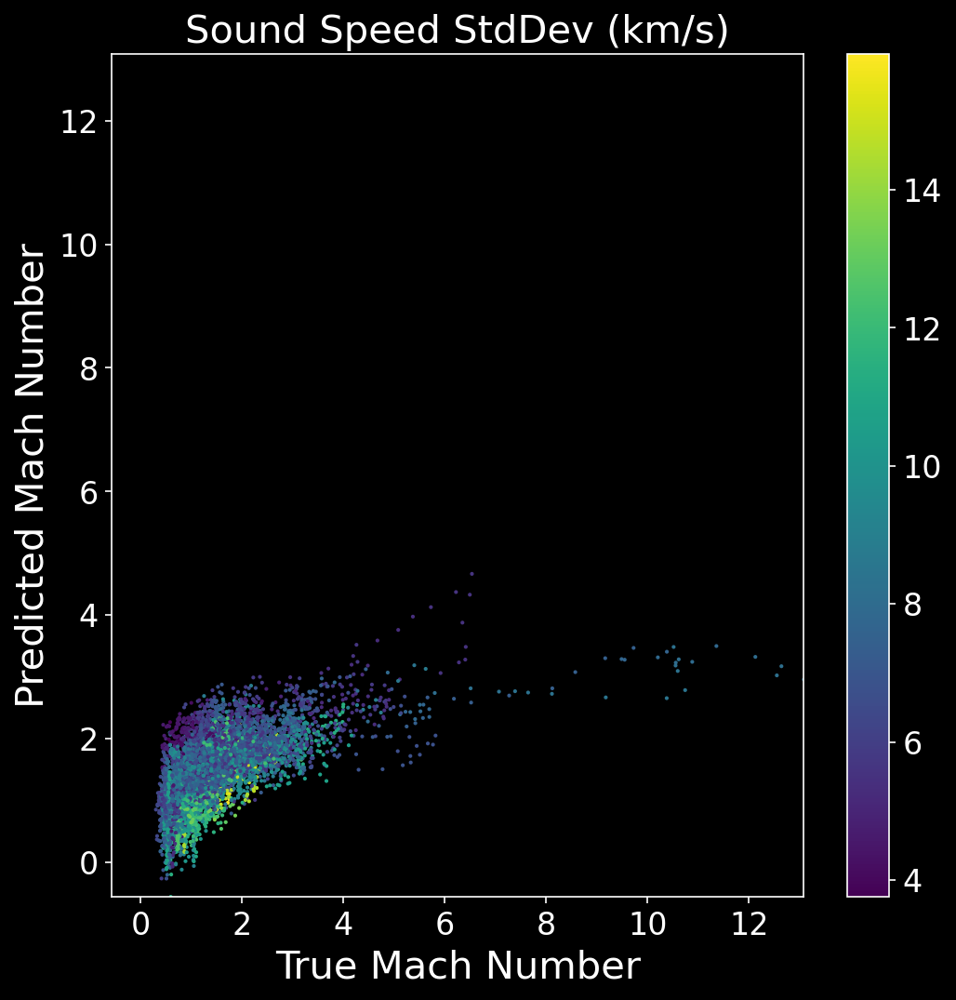

In [127]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test,y_pred_test,c=np.sqrt(sorted_tlabels[test,62]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.xlim([np.min(y_pred_test),np.max(y_test)])
plt.ylim([np.min(y_pred_test),np.max(y_test)])

(0.0, 4.0)

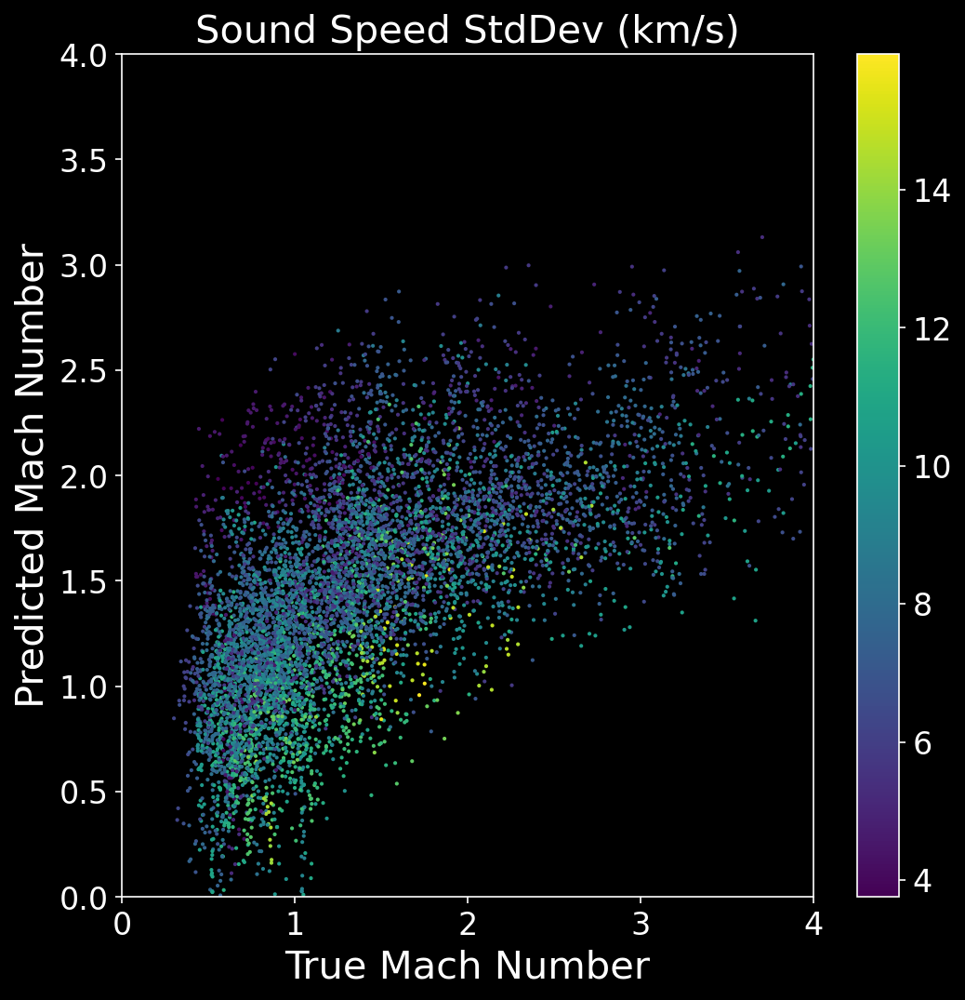

In [128]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test,y_pred_test,c=np.sqrt(sorted_tlabels[test,62]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.xlim([0,4])
plt.ylim([0,4])

In [131]:
sorted_tlabels[:,[21,22]].shape

(96720, 2)

In [132]:
hotlabels = [21,22]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(241933.39564102908, 473721.3987513352)

Text(0, 0.5, 'Predicted Sound Speed')

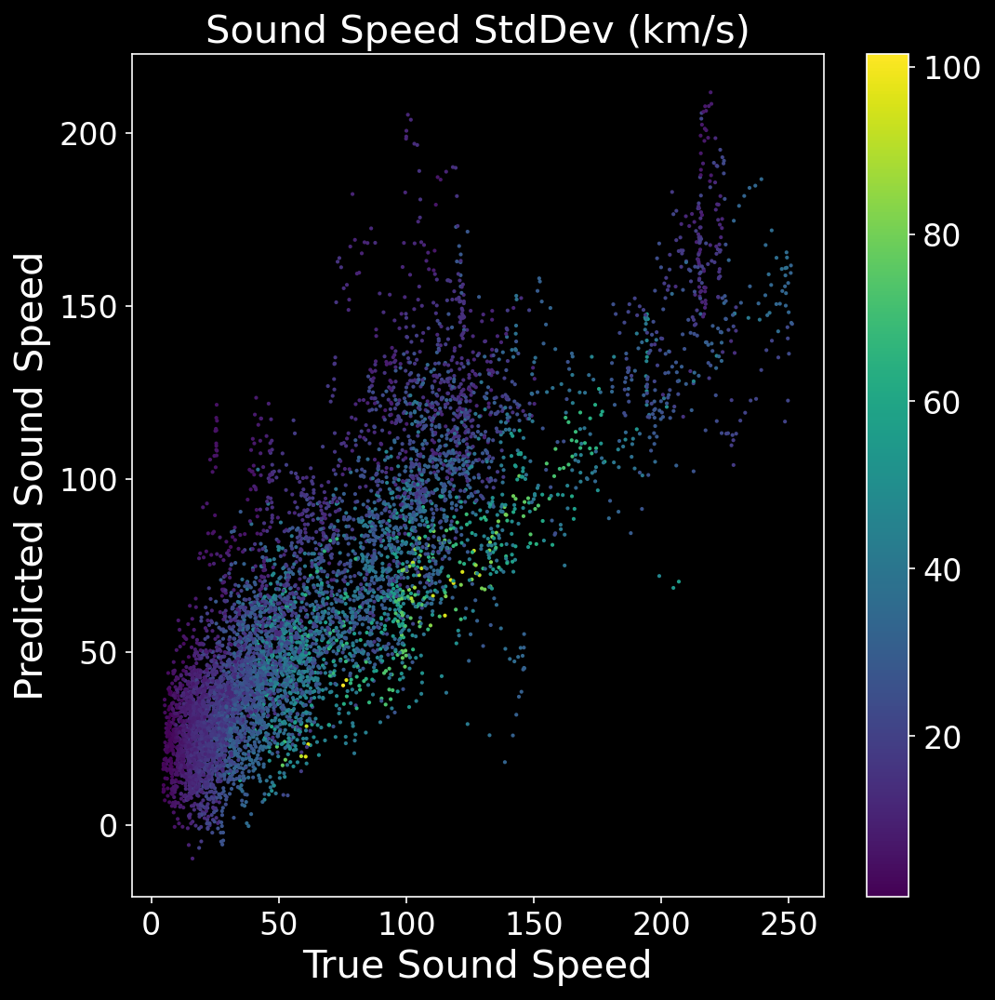

In [134]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=np.sqrt(sorted_tlabels[test,22]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Sound Speed')
plt.ylabel('Predicted Sound Speed')

In [137]:
np.count_nonzero(test)

7440

In [138]:
hotlabels = [21,65]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(283.6946165480657, 413.36023222338395)

Text(0, 0.5, 'Predicted Sound Speed')

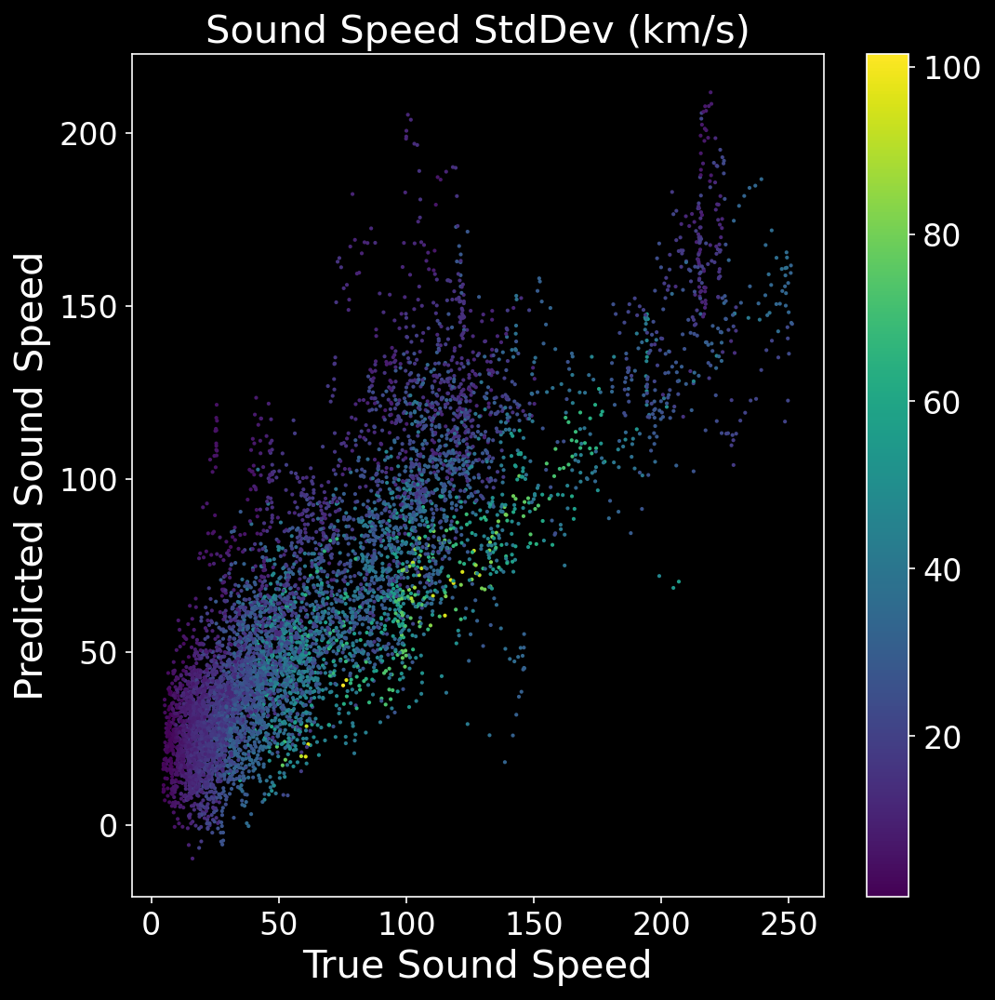

In [139]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=np.sqrt(sorted_tlabels[test,22]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Sound Speed')
plt.ylabel('Predicted Sound Speed')

In [141]:
sc=StandardScaler()
data = CF_DHC_iso_log_a
data_pre = sc.fit_transform(np.arcsinh(data[sort_label_list,:]/(1e-20)))
data_in = data_pre

In [142]:
hotlabels = [21,65]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(283.6946165480659, 413.3602322230166)

Text(0, 0.5, 'Predicted Sound Speed')

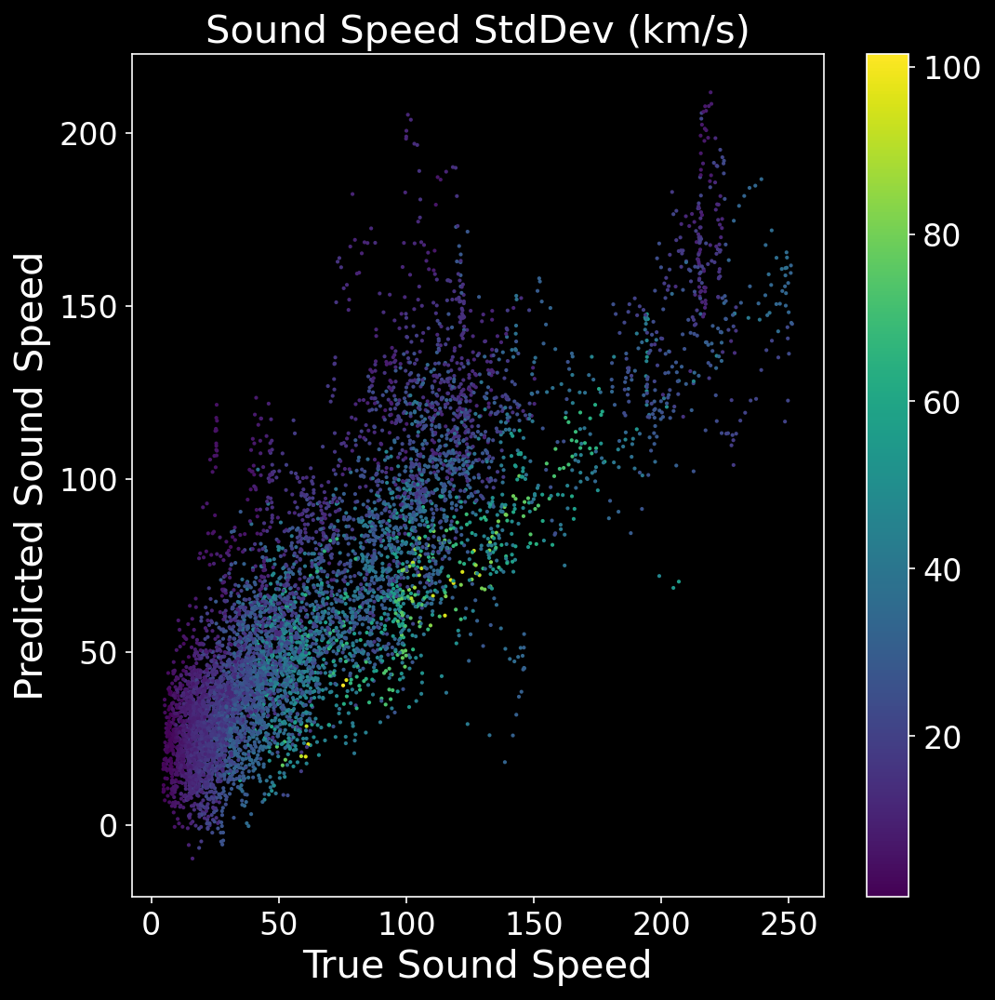

In [143]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=np.sqrt(sorted_tlabels[test,22]),s=1)
plt.colorbar()
plt.title('Sound Speed StdDev (km/s)')
plt.xlabel('True Sound Speed')
plt.ylabel('Predicted Sound Speed')

In [144]:
hotlabels = [11,65]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(0.2127173752926618, 0.3017571629195708)

Text(0, 0.5, 'Predicted Mean Log Density')

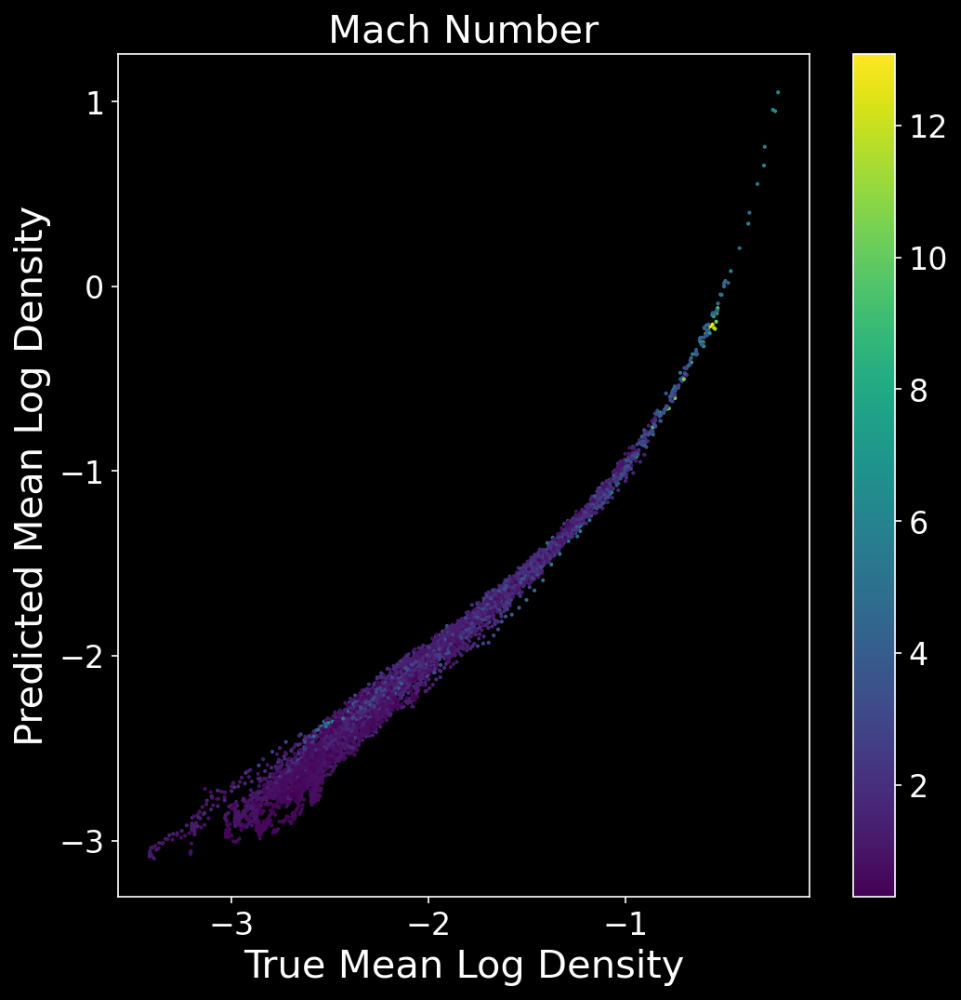

In [148]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=sorted_tlabels[test,65],s=1)
plt.colorbar()
plt.title('Mach Number')
plt.xlabel('True Mean Log Density')
plt.ylabel('Predicted Mean Log Density')

Text(0, 0.5, 'Predicted Mach Number')

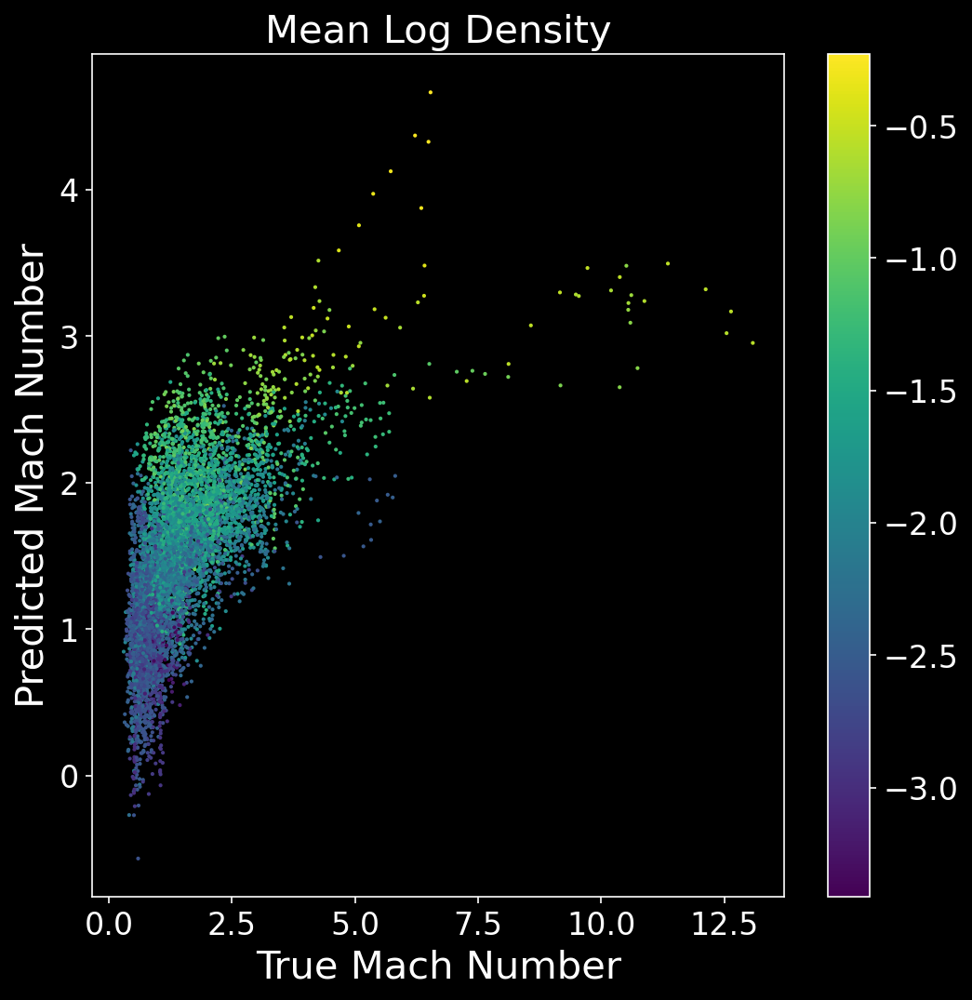

In [151]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,1],y_pred_test[:,1],c=sorted_tlabels[test,11],s=1)
plt.colorbar()
plt.title('Mean Log Density')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')

(0.0, 4.0)

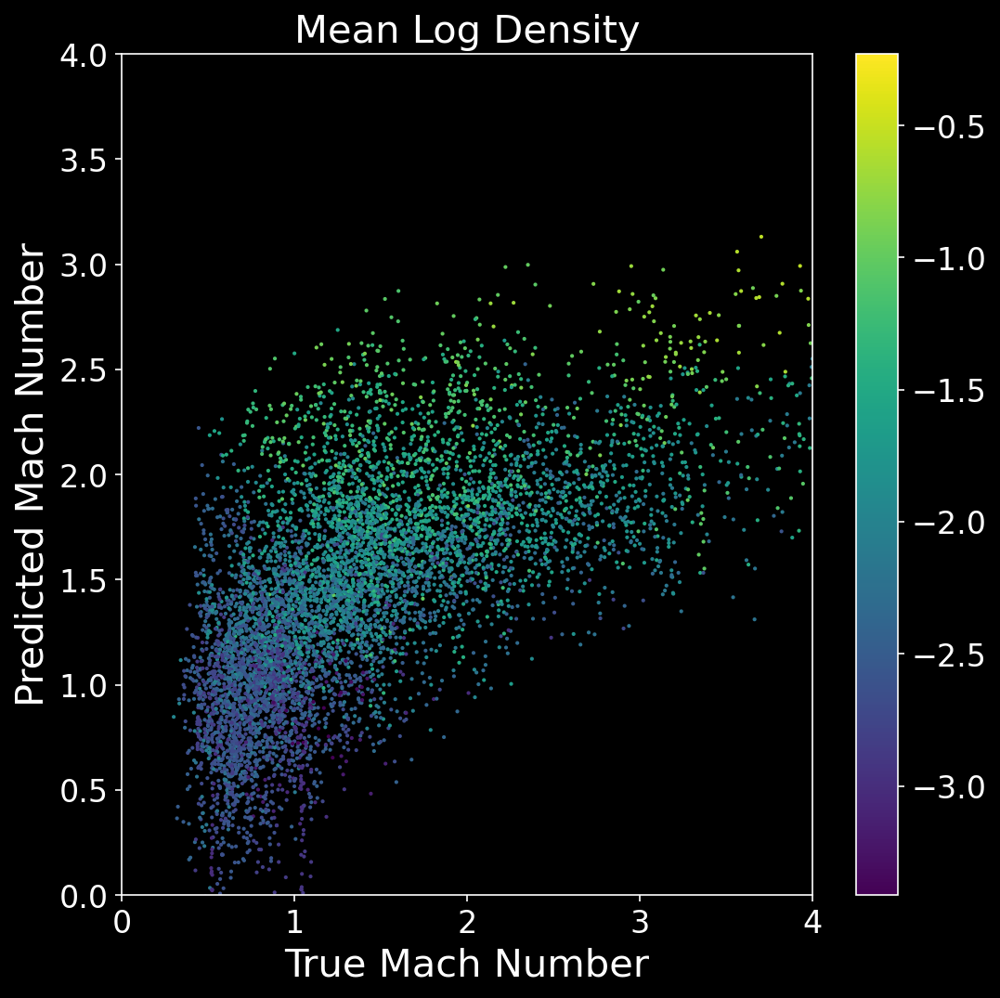

In [152]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,1],y_pred_test[:,1],c=sorted_tlabels[test,11],s=1)
plt.colorbar()
plt.title('Mean Log Density')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.ylim([0,4])
plt.xlim([0,4])

In [153]:
hotlabels = [65]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(0.41956905780570436, 0.595654498473865)

(0.0, 4.0)

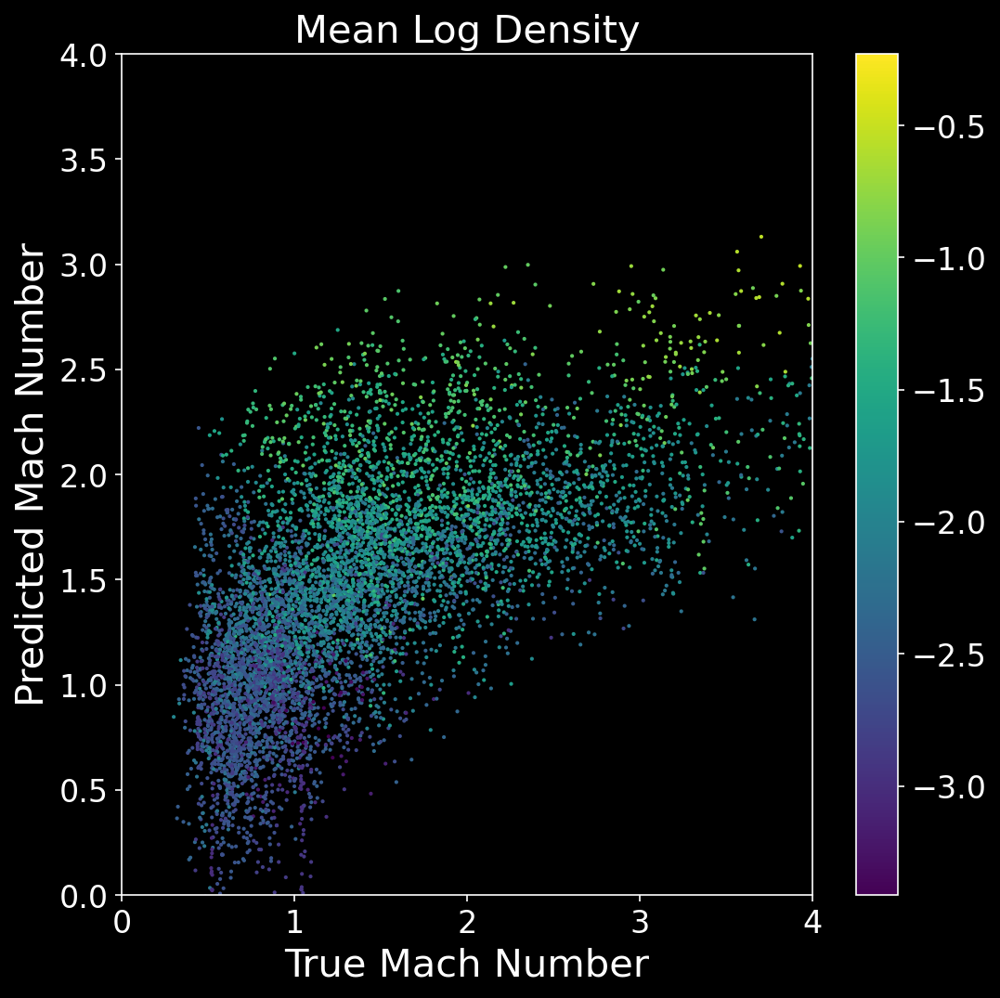

In [154]:
fig = plt.figure(figsize=(8,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=sorted_tlabels[test,11],s=1)
plt.colorbar()
plt.title('Mean Log Density')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.ylim([0,4])
plt.xlim([0,4])

In [9]:
hotlabels = [11,12,21,22,62,65,68]

train = [np.all([np.logical_or(
                ele[5]!=0,
                ele[6]!=0)]) for ele in sorted_tlabels]
test = [np.all([ele[5]==0,
                ele[6]==0]) for ele in sorted_tlabels]
Y = sorted_tlabels[:,hotlabels]
X_train = data_in[train]
X_test = data_in[test]
y_train = Y[train]
y_test = Y[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(69235.62132911435, 135492.1929235925)

(0.0, 4.0)

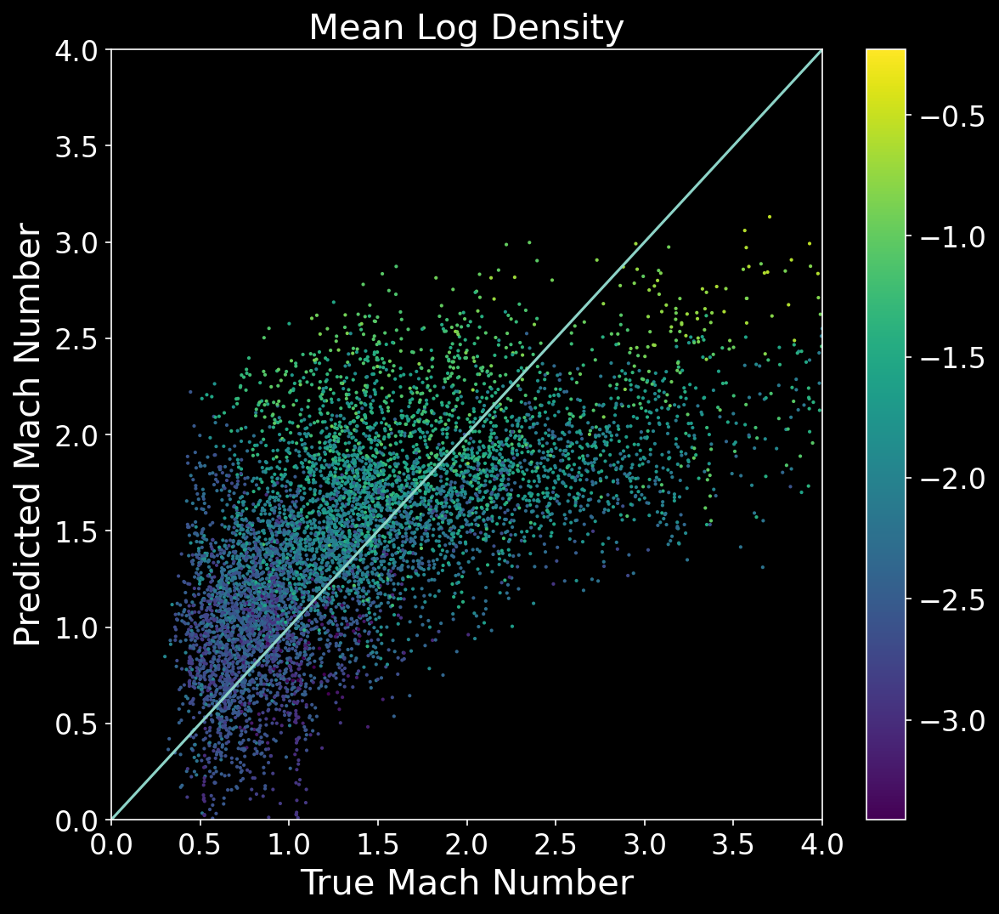

In [10]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,5],y_pred_test[:,5],c=sorted_tlabels[test,11],s=1)
plt.plot(np.arange(0,5),np.arange(0,5))
plt.colorbar()
plt.title('Mean Log Density')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.ylim([0,4])
plt.xlim([0,4])

(-0.5, 12.0)

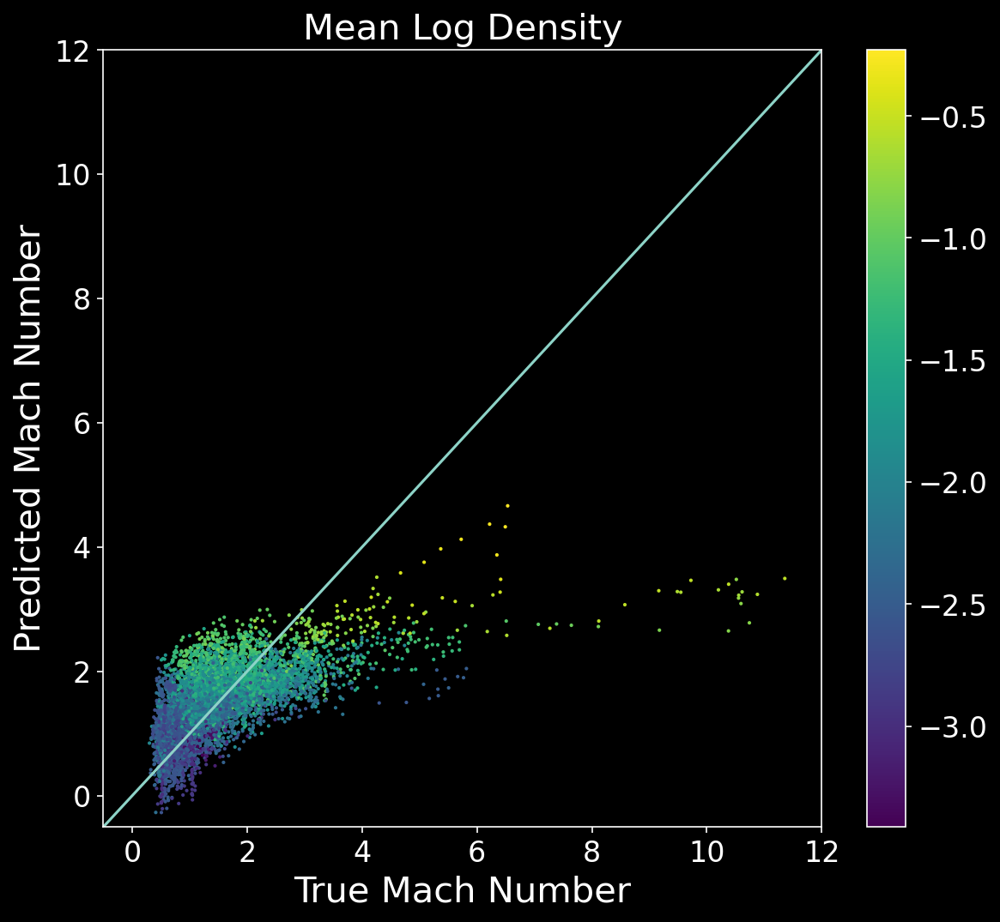

In [11]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,5],y_pred_test[:,5],c=sorted_tlabels[test,11],s=1)
plt.plot(np.arange(-1,13),np.arange(-1,13))
plt.colorbar()
plt.title('Mean Log Density')
plt.xlabel('True Mach Number')
plt.ylabel('Predicted Mach Number')
plt.ylim([-0.5,12])
plt.xlim([-0.5,12])

Text(0, 0.5, 'Predicted Virial Parameter')

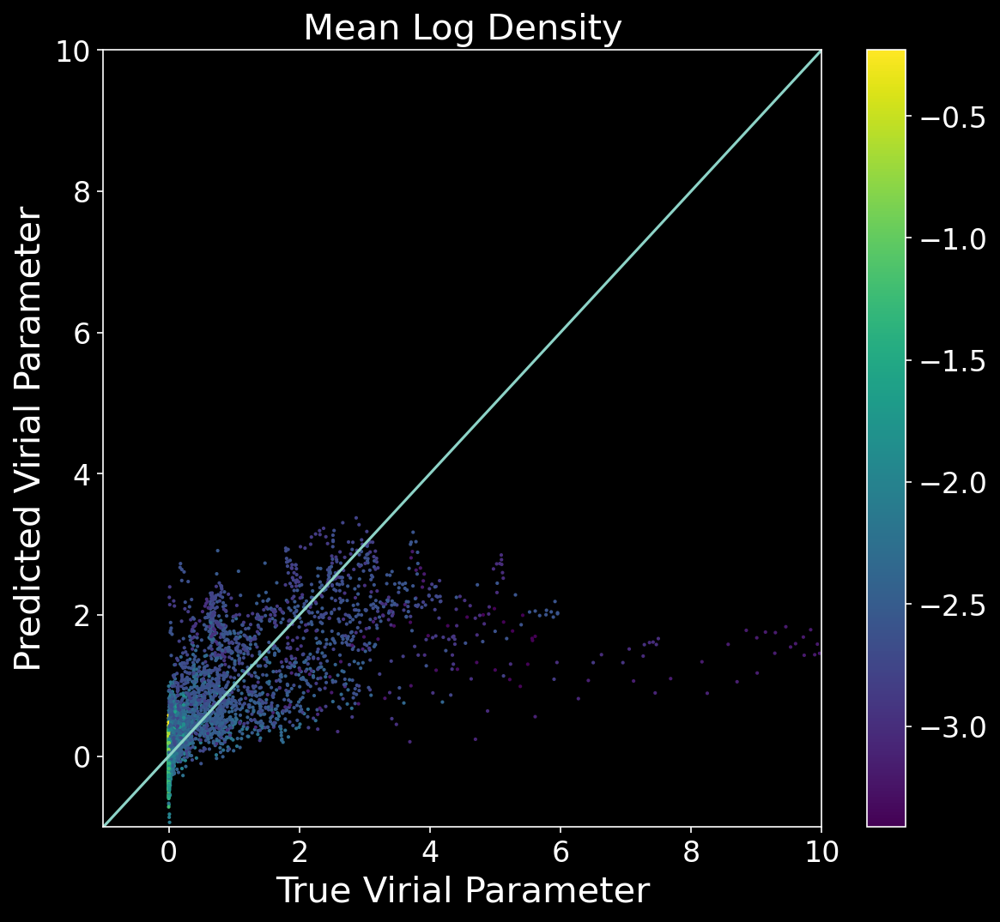

In [33]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,6],y_pred_test[:,6],c=sorted_tlabels[test,11],s=1)
plt.colorbar()

plt.plot(np.linspace(-1,10),np.linspace(-1,10))
plt.xlim([-1,10])
plt.ylim([-1,10])

plt.title('Mean Log Density')
plt.xlabel('True Virial Parameter')
plt.ylabel('Predicted Virial Parameter')

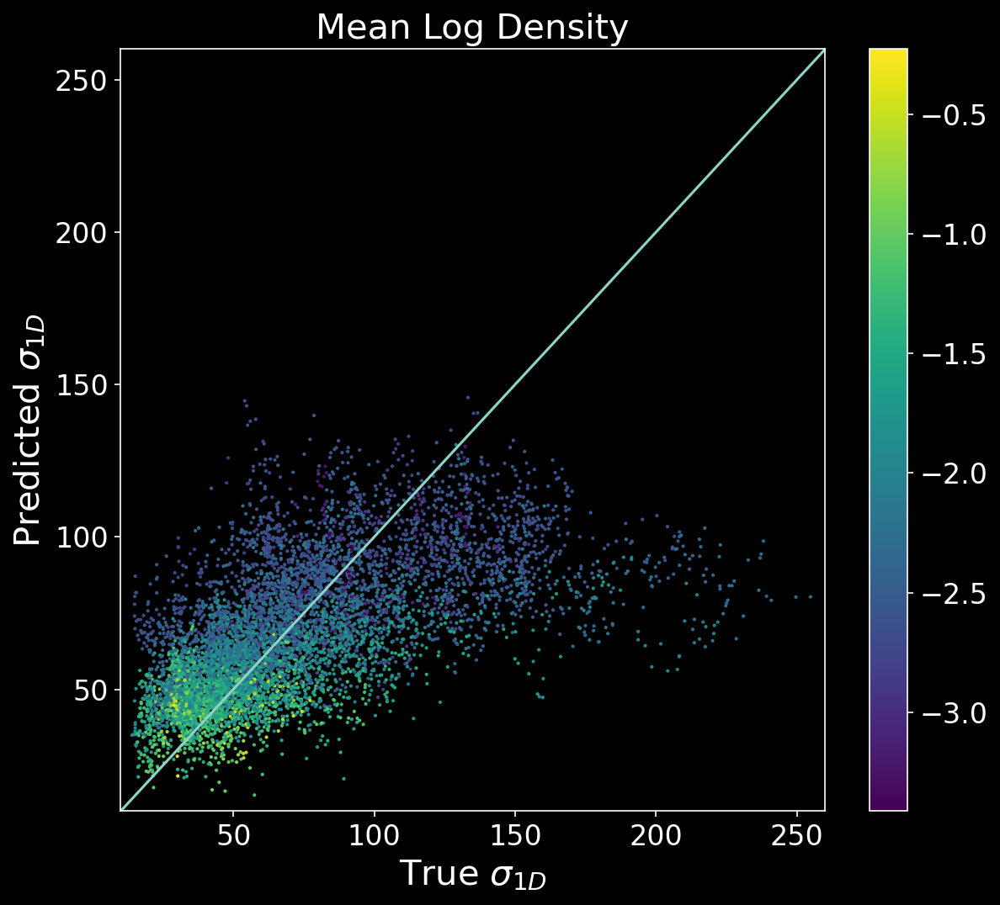

In [13]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,4],y_pred_test[:,4],c=sorted_tlabels[test,11],s=1)
plt.plot(np.linspace(0,300),np.linspace(0,300))
plt.xlim([10,260])
plt.ylim([10,260])
plt.title('Mean Log Density')
plt.xlabel('True $\sigma_{1D}$')
plt.ylabel('Predicted $\sigma_{1D}$')
plt.colorbar()

Text(0, 0.5, 'Predicted Variance Sound Speed')

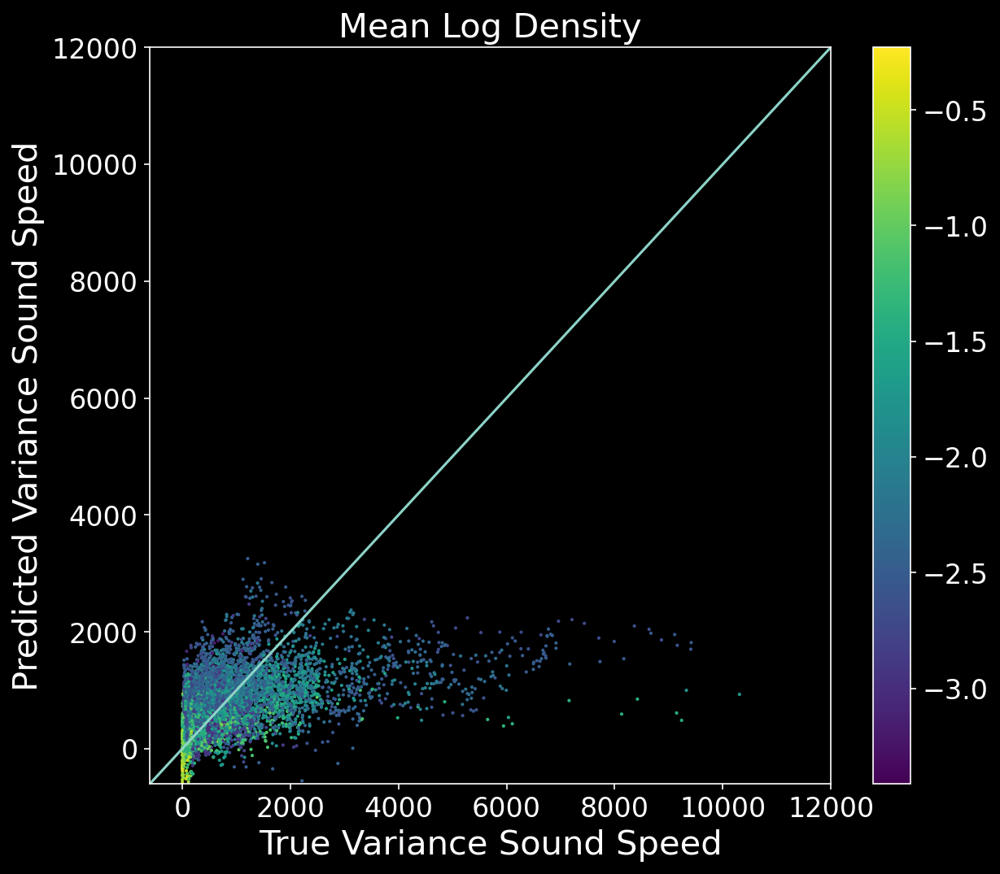

In [31]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,3],y_pred_test[:,3],c=sorted_tlabels[test,11],s=1)
plt.colorbar()

plt.plot(np.linspace(-1000,20000),np.linspace(-1000,20000))
plt.xlim([-600,12000])
plt.ylim([-600,12000])

plt.title('Mean Log Density')
plt.xlabel('True Variance Sound Speed')
plt.ylabel('Predicted Variance Sound Speed')

Text(0, 0.5, 'Predicted Sound Speed')

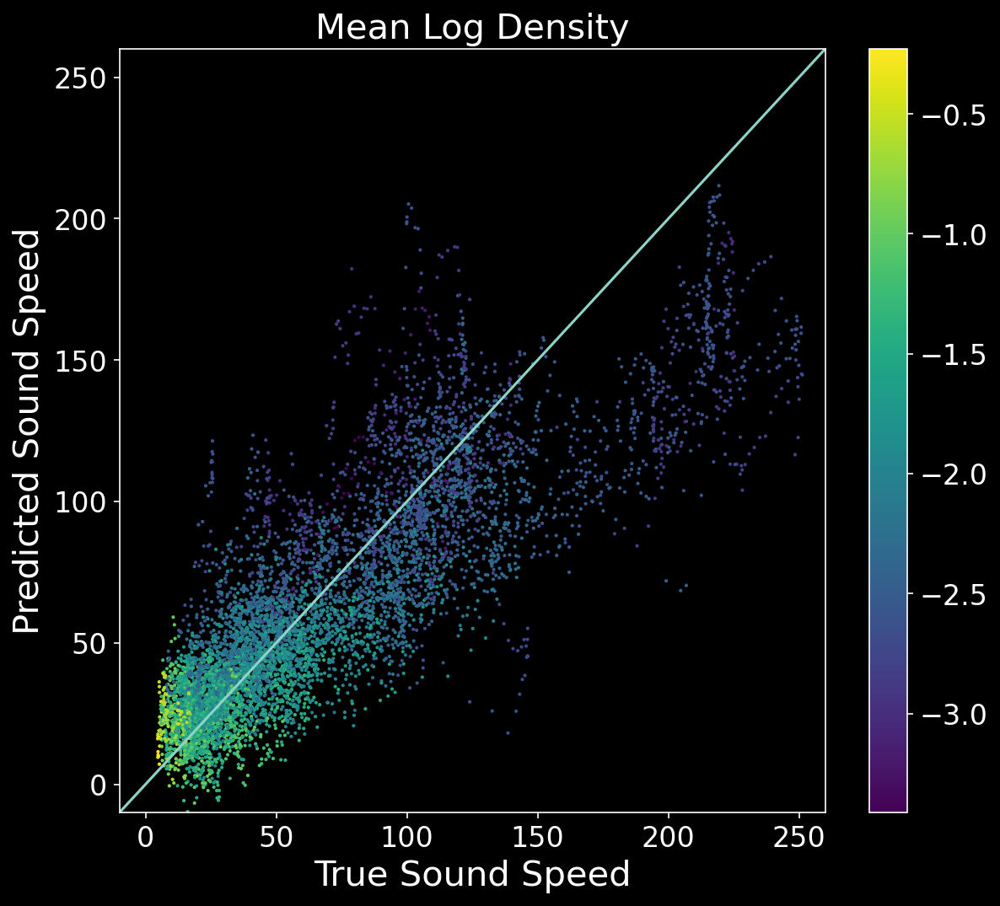

In [29]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,2],y_pred_test[:,2],c=sorted_tlabels[test,11],s=1)
plt.colorbar()

plt.plot(np.linspace(-20,300),np.linspace(-20,300))
plt.xlim([-10,260])
plt.ylim([-10,260])

plt.title('Mean Log Density')
plt.xlabel('True Sound Speed')
plt.ylabel('Predicted Sound Speed')

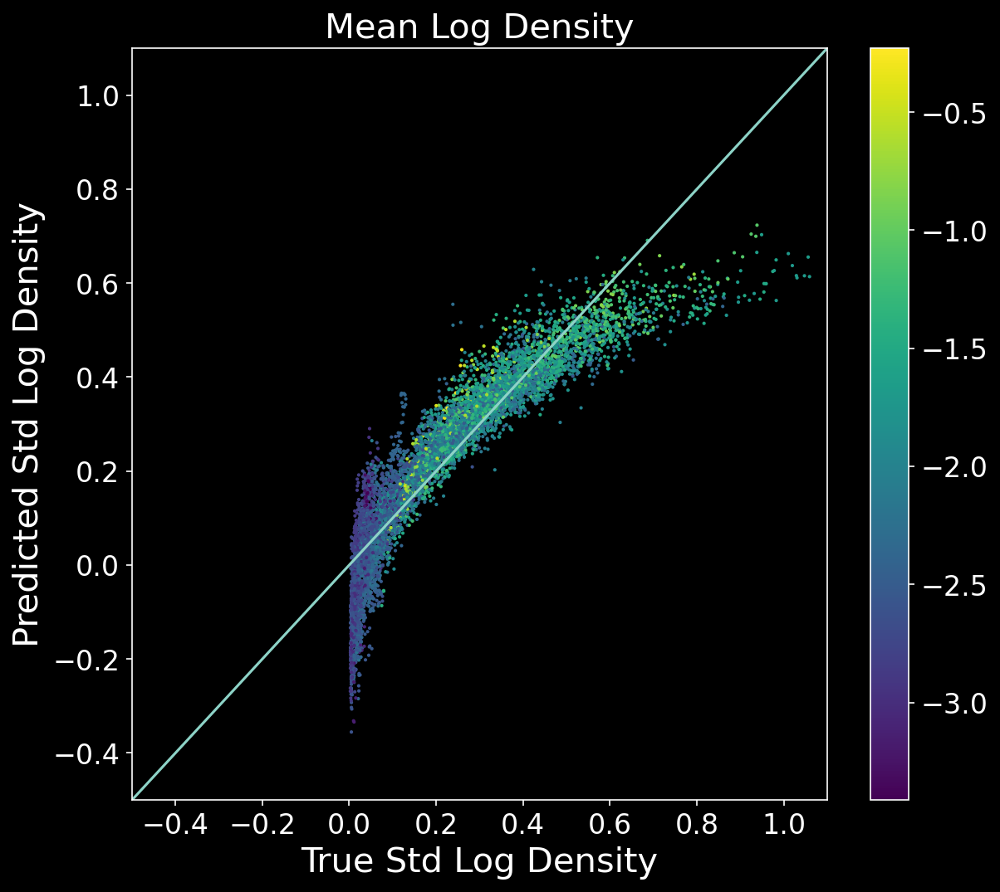

In [27]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,1],y_pred_test[:,1],c=y_test[:,0],s=1)

plt.plot(np.linspace(-4,2),np.linspace(-4,2))
plt.xlim([-.5,1.1])
plt.ylim([-.5,1.1])

plt.title('Mean Log Density')
plt.xlabel('True Std Log Density')
plt.ylabel('Predicted Std Log Density')
plt.colorbar()

puzzle to sort is out is why tlables[test,11] did not work but y_test[:,1] did. Also, I would suggest running this on the MHD sims from BB as a next step; then rotation angle.

stupid 0 v 1 indexing

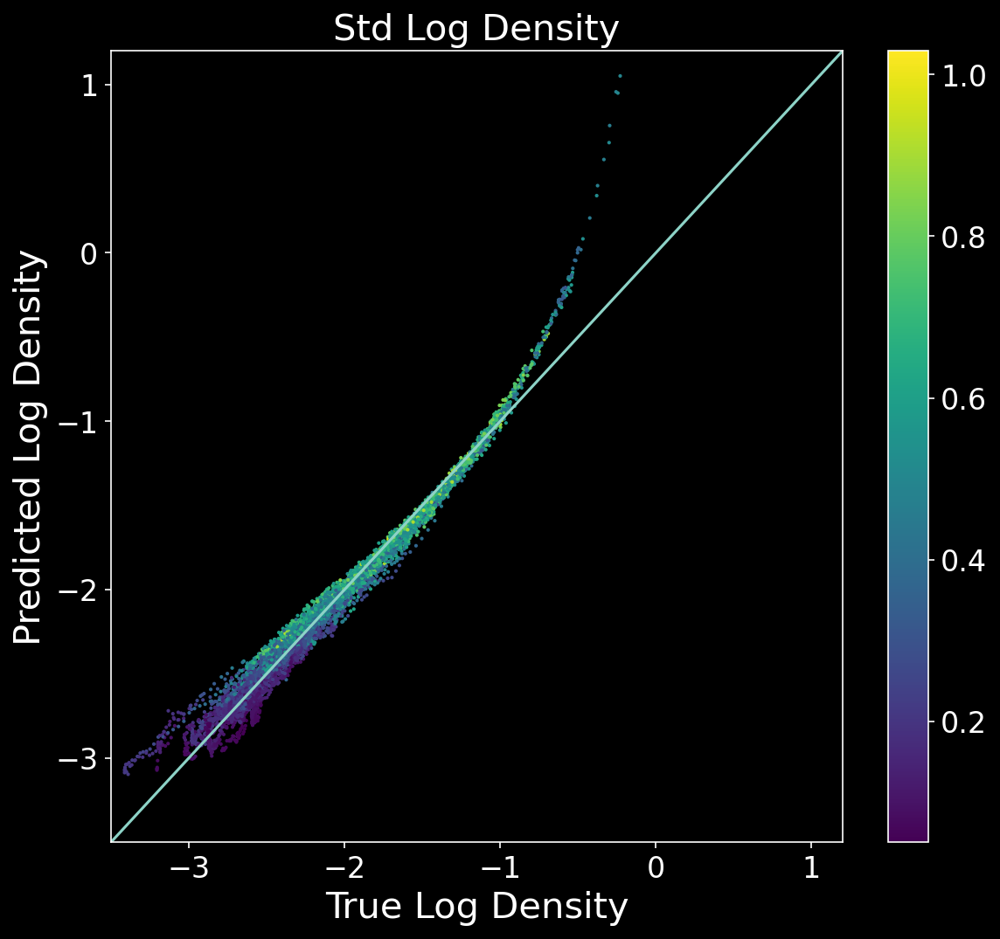

In [24]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=np.sqrt(y_test[:,1]),s=1)

plt.title('Std Log Density')
plt.xlabel('True Log Density')
plt.ylabel('Predicted Log Density')
plt.plot(np.linspace(-4,2),np.linspace(-4,2))
plt.xlim([-3.5,1.2])
plt.ylim([-3.5,1.2])

plt.colorbar()

BB sims, just WST, no DHC yet

In [35]:
labels = [[4.0,0.7],[2.0,0.7],[1.2,0.7],[0.7,0.7],[0.7,2.0],[1.2,2.0],[2.0,2.0],[4.0,2.0]]

WST_out_MHD = hd5_open('/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ZenodoRepos/WST/Coefficients/WST_out_MHD.h5','data')
Y_old = np.repeat(np.array([-3,2,-4,5,4,3,-2,-5]),WST_out_MHD.shape[0]/8)
RWST_out_MHD = hd5_open('/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ZenodoRepos/WST/Coefficients/RWST_out_MHD.h5','data')
Y_old = np.repeat(np.array([-3,2,-4,5,4,3,-2,-5]),RWST_out_MHD.shape[0]/8)
PCF_out_MHD = np.abs(hd5_open('/Users/saydjari/Dropbox/GradSchool_AKS/Doug/ZenodoRepos/WST/Coefficients/PCF_out_MHD.h5','data'))
Y = np.repeat(np.array([-4,5,2,4,3,-2,-3,-5]),PCF_out_MHD.shape[0]/8)

In [36]:
indexes = [i for i in product(range(0,72),range(0,2),range(0,3),range(0,32))]
indexes = np.array([list(ele) for ele in indexes])
test = [np.logical_and(np.logical_or(np.remainder(ele[0],9)==6,(np.remainder(ele[0],9)==2)),ele[1]==0) for ele in indexes]
train = [np.logical_and(np.logical_and(np.remainder(ele[0],9)!=6,(np.remainder(ele[0],9)!=2)),ele[1]==0) for ele in indexes]

In [37]:
x_data = WST_out_MHD
y_data = Y_old
n_components = 7
label_list = labels

sc = StandardScaler()
X_train = sc.fit_transform(x_data[train])
X_test = sc.transform(x_data[test])

y_train = y_data[train]
y_test = y_data[test]

In [38]:
reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(0.4911014791451329, 1.1716139623849509)

In [54]:
dict_lables = {
    -5:0,
    -4:1,
    -3:2,
    -2:3,
    2:4,
    3:5,
    4:6,
    5:7,
}
    
def cm_eval(y_pred, y_true,n_classes,dict_lables):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[dict_lables[y_true[indx]],dict_lables[y_pred[indx]]] += 1
    return cm.astype(int)

class_pred = np.round(y_pred).astype(int)

cm_0 = cm_eval(class_pred,y_test,8,dict_lables)

fig = plt.figure(figsize=(24,16),dpi=150)
ax = fig.add_subplot(1,1,1)
cm_subplot(cm_0,labels,ax,test_lossl2)

KeyError: -1

In [49]:
np.unique(y_test)

array([-5, -4, -3, -2,  2,  3,  4,  5])

In [61]:
dict_labels = {
    -5:0,
    -4:1,
    -3:2,
    -2:3,
    2:4,
    3:5,
    4:6,
    5:7,
}

In [52]:
[-4]

1

In [62]:
hot_encoding_vec = [labels[dict_labels[ele]] for ele in Y_old]

In [65]:
np.array(hot_encoding_vec).shape

(13824, 2)

In [68]:
x_data = WST_out_MHD
y_data = np.array(hot_encoding_vec)
label_list = labels

sc = StandardScaler()
X_train = sc.fit_transform(x_data[train])
X_test = sc.transform(x_data[test])

y_train = y_data[train]
y_test = y_data[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

train_lossl2,test_lossl2

(0.04802766971702735, 0.12399784419445037)

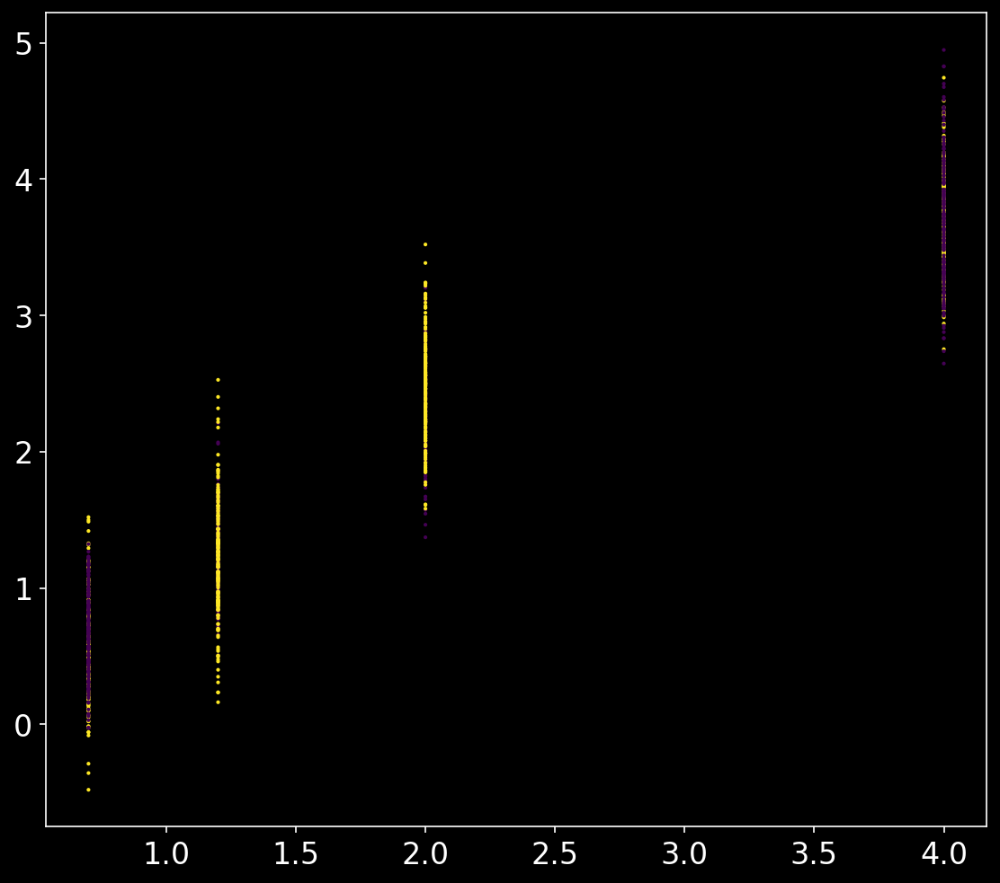

In [69]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=y_test[:,1],s=1)

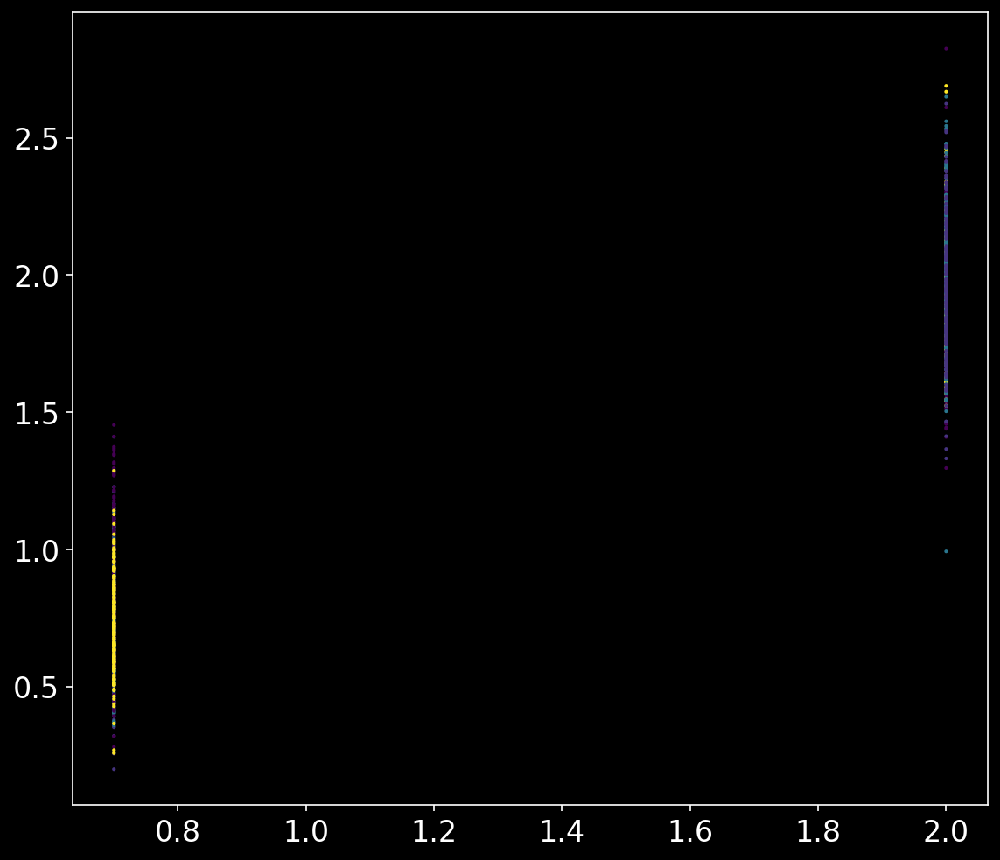

In [70]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_test[:,1],y_pred_test[:,1],c=y_test[:,0],s=1)

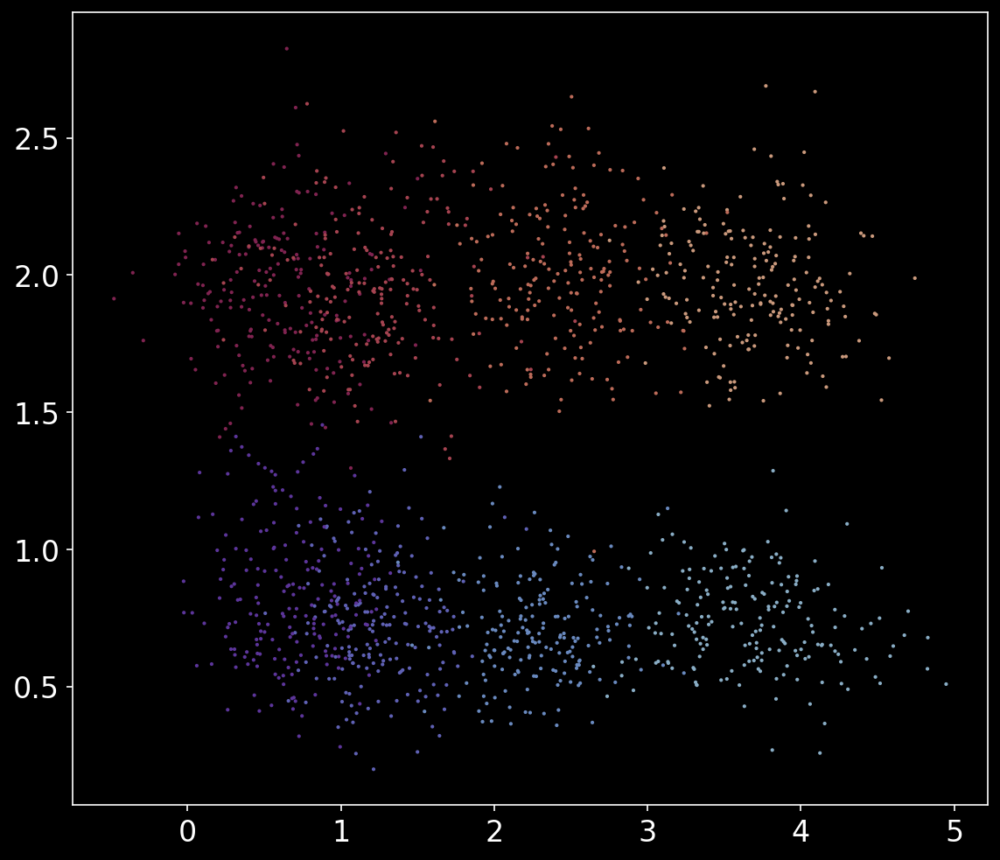

In [75]:
fig = plt.figure(figsize=(9,8),dpi=150)
plt.scatter(y_pred_test[:,0],y_pred_test[:,1],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)

In [99]:
MS_pred = [MS[np.argmin(np.abs(x[0]-MS))] for x in y_pred_test]
MA_pred = [MA[np.argmin(np.abs(x[1]-MA))] for x in y_pred_test]

In [84]:
MS = np.unique(np.array(labels)[:,0])
MA = np.unique(np.array(labels)[:,1])

In [90]:
inverse_dict = {
    (4.0,0.7):-5,
    (2.0,0.7):-4,
    (1.2,0.7):-3,
    (0.7,0.7):-2,
    (0.7,2.0):2,
    (1.2,2.0):3,
    (2.0,2.0):4,
    (4.0,2.0):5,
}

In [100]:
numeric_class = [inverse_dict[x,y] for (x,y) in zip (MS_pred,MA_pred)]

In [101]:
numeric_class

[-2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -4,
 -3,
 -3,
 -3,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -2,
 -3,
 -2,
 -3,
 -3,
 -3,
 -2,
 -3,
 -4,
 -3,
 -3,
 -3,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -4,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -4,
 -4,
 -4,
 -2,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -4,
 -3,
 -3,
 -3,
 -4,
 -4,
 -3,
 -3,
 -3,
 -4,
 -2,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -2,
 -3,
 -4,
 -3,
 -3,
 -3,
 -2,
 -3,
 -3,
 -3,
 -2,
 -3,
 -4,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -3,
 -3,
 -3,
 -3,
 -3,
 -3,
 -4,
 -4,
 -3,
 -3,
 -3,
 -3,
 -4,
 -3,
 3,
 -3,
 -3,
 -3,
 -3,
 -2,
 -4,
 -2,
 -2,
 -3,
 -2,
 -3,
 -4,
 -4,
 -3,
 -3,
 -4,
 -3,
 -3,
 -4,
 -4,
 -3,
 -3,
 -2,
 -3,
 -2,
 -3,
 2,
 3,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 3,
 

In [94]:
Y_old[test]

array([-3, -3, -3, ..., -5, -5, -5])

In [111]:
def cm_subplot(cm,label_list,ax,loss):
    prec = np.diag(cm).sum()/np.sum(cm)
    cmap_normal = (cm.T/cm.sum(axis=1)).T

    ## Good plots
    vmin=-7
    vmax=7
    marker_size = 10

    from matplotlib import cm as cmplt
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    rgba_colors = [cmplt.twilight(norm(i)) for i in [-4,-3,-2,-1,1,2,3,4]]
    color_order = ["black", "white"]
    color_map = "gray"
    colormap='twilight'

    ax.imshow(cmap_normal,
          interpolation='none',
          cmap=color_map,
          aspect='equal',
          vmin=0,vmax=1)

    ax.set_xticks(np.arange(cm.shape[0]))
    ax.set_yticks(np.arange(cm.shape[1]))

    for ytick, color in zip(ax.get_yticklabels(), rgba_colors):
        ytick.set_color(color)

    ax.set_xticklabels(label_list)
    ax.set_yticklabels(label_list)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')

    plt.setp(ax.get_xticklabels(), rotation=90, ha="right",va='center',
             rotation_mode="anchor")
    plt.title('TPP {:.2f}%/L2-Loss {:.3f}'.format(100*prec,loss))

    # Loop over data dimensions and create text annotations.
    textcolors=color_order
    threshold = 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] != 0:
                text = ax.text(j, i, cm[i, j],
                               ha="center", va="center", 
                               color=textcolors[int(cmap_normal[i, j] < threshold)])
    ax.margins(x=0.1, y=0.05)

    return

Text(0, 0.5, 'Predicted $M_S$')

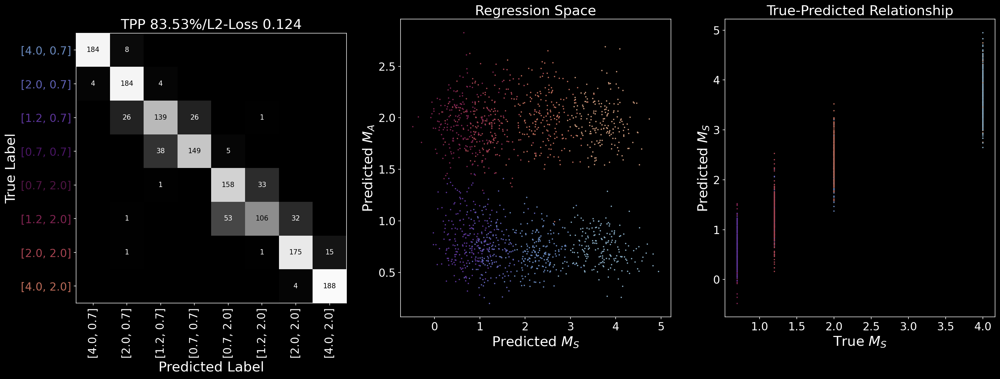

In [116]:
dict_lables = {
    -5:0,
    -4:1,
    -3:2,
    -2:3,
    2:4,
    3:5,
    4:6,
    5:7,
}
    
def cm_eval(y_pred, y_true,n_classes,dict_lables):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[dict_lables[y_true[indx]],dict_lables[y_pred[indx]]] += 1
    return cm.astype(int)

class_pred = np.round(y_pred).astype(int)

cm_0 = cm_eval(np.array(numeric_class),Y_old[test],8,dict_lables)

fig = plt.figure(figsize=(24,8),dpi=150)
ax = fig.add_subplot(1,3,1)
cm_subplot(cm_0,labels,ax,test_lossl2)

ax = fig.add_subplot(1,3,2)
plt.scatter(y_pred_test[:,0],y_pred_test[:,1],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('Regression Space')
plt.xlabel('Predicted $M_S$')
plt.ylabel('Predicted $M_A$')

ax = fig.add_subplot(1,3,3)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('True-Predicted Relationship')
plt.xlabel('True $M_S$')
plt.ylabel('Predicted $M_S$')

In [127]:
x_data = RWST_out_MHD
y_data = np.array(hot_encoding_vec)
n_components = 7
label_list = labels

sc = StandardScaler()
X_train = sc.fit_transform(x_data[train])
X_test = sc.transform(x_data[test])

y_train = y_data[train]
y_test = y_data[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

MS_pred = [MS[np.argmin(np.abs(x[0]-MS))] for x in y_pred_test]
MA_pred = [MA[np.argmin(np.abs(x[1]-MA))] for x in y_pred_test]

numeric_class = [inverse_dict[x,y] for (x,y) in zip (MS_pred,MA_pred)]

train_lossl2,test_lossl2

(0.07638013307958791, 1.1628791328535766)

(0.0, 5.0)

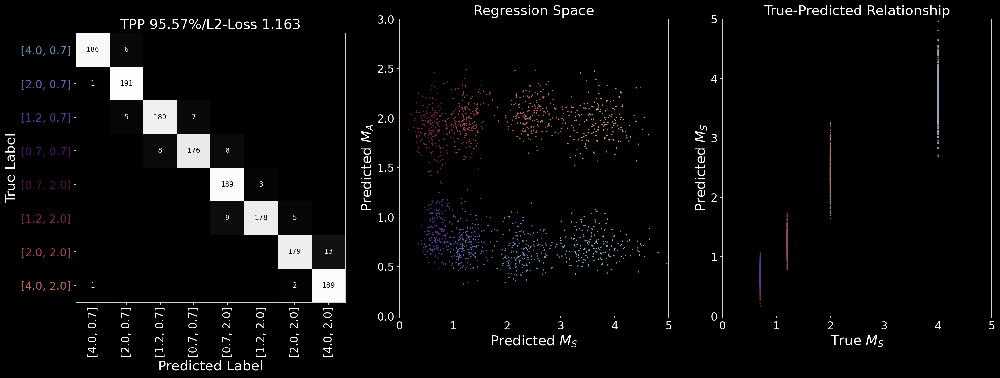

In [131]:
dict_lables = {
    -5:0,
    -4:1,
    -3:2,
    -2:3,
    2:4,
    3:5,
    4:6,
    5:7,
}
    
def cm_eval(y_pred, y_true,n_classes,dict_lables):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[dict_lables[y_true[indx]],dict_lables[y_pred[indx]]] += 1
    return cm.astype(int)

class_pred = np.round(y_pred).astype(int)

cm_0 = cm_eval(np.array(numeric_class),Y_old[test],8,dict_lables)

fig = plt.figure(figsize=(24,8),dpi=150)
ax = fig.add_subplot(1,3,1)
cm_subplot(cm_0,labels,ax,test_lossl2)

ax = fig.add_subplot(1,3,2)
plt.scatter(y_pred_test[:,0],y_pred_test[:,1],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('Regression Space')
plt.xlabel('Predicted $M_S$')
plt.ylabel('Predicted $M_A$')
plt.xlim([0,5])
plt.ylim([0,3])

ax = fig.add_subplot(1,3,3)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('True-Predicted Relationship')
plt.xlabel('True $M_S$')
plt.ylabel('Predicted $M_S$')
plt.xlim([0,5])
plt.ylim([0,5])

In [134]:
hot_encoding_vec = [labels[dict_labels[ele]] for ele in Y]

x_data = PCF_out_MHD
y_data = np.array(hot_encoding_vec)
n_components = 7
label_list = labels

sc = StandardScaler()
X_train = sc.fit_transform(x_data[train])
X_test = sc.transform(x_data[test])

y_train = y_data[train]
y_test = y_data[test]

reg = LinearRegression().fit(X_train, y_train)
y_pred_test = reg.predict(X_test)
y_pred_train = reg.predict(X_train)
train_lossl2 = np.mean(np.square(y_pred_train-y_train))
test_lossl2 = np.mean(np.square(y_pred_test-y_test))

MS_pred = [MS[np.argmin(np.abs(x[0]-MS))] for x in y_pred_test]
MA_pred = [MA[np.argmin(np.abs(x[1]-MA))] for x in y_pred_test]

numeric_class = [inverse_dict[x,y] for (x,y) in zip (MS_pred,MA_pred)]

train_lossl2,test_lossl2

(0.17196763119272865, 0.27713632384871184)

(0.0, 5.0)

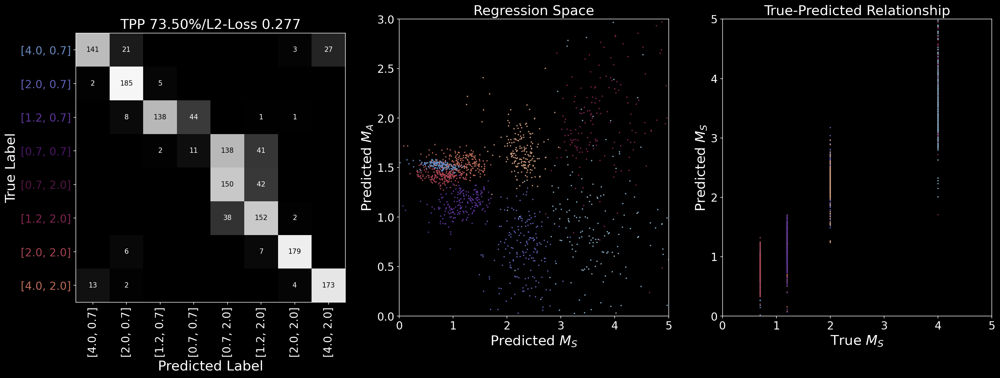

In [136]:
dict_lables = {
    -5:0,
    -4:1,
    -3:2,
    -2:3,
    2:4,
    3:5,
    4:6,
    5:7,
}
    
def cm_eval(y_pred, y_true,n_classes,dict_lables):
    cm = np.zeros((n_classes,n_classes))
    for indx in range(y_pred.shape[0]):
        cm[dict_lables[y_true[indx]],dict_lables[y_pred[indx]]] += 1
    return cm.astype(int)

class_pred = np.round(y_pred).astype(int)

cm_0 = cm_eval(np.array(numeric_class),Y[test],8,dict_lables)

fig = plt.figure(figsize=(24,8),dpi=150)
ax = fig.add_subplot(1,3,1)
cm_subplot(cm_0,labels,ax,test_lossl2)

ax = fig.add_subplot(1,3,2)
plt.scatter(y_pred_test[:,0],y_pred_test[:,1],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('Regression Space')
plt.xlabel('Predicted $M_S$')
plt.ylabel('Predicted $M_A$')
plt.xlim([0,5])
plt.ylim([0,3])

ax = fig.add_subplot(1,3,3)
plt.scatter(y_test[:,0],y_pred_test[:,0],c=Y_old[test],s=1,cmap='twilight',vmin=-7,vmax=7)
plt.title('True-Predicted Relationship')
plt.xlabel('True $M_S$')
plt.ylabel('Predicted $M_S$')
plt.xlim([0,5])
plt.ylim([0,5])